<a href="https://colab.research.google.com/github/Juacardonaca/SyS2025-II/blob/main/TransformadaFourier_SAudio.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Para el cálculo de armonicos tenemos:

\begin{equation}
X[k] = \sum_{n=0}^{N-1}{x[n]e^{-j\frac{2\pi}{N}Kn}}
\end{equation}

La FFT usa el modelo discreto de la Transformada de Fourier para representar una señal periódica como la suma de armónicos senoidales discretos.

Divide la señal en N muestras y los coeficientes espectrales de X[k], que indican la amplitud y fase de cada frecuencia armónica múltiplo de la fundamental.

En conclusión la FFT descompone la señal en sus armónicos de forma rápida y eficiente, permitiendo conocer su magnitud y fase.

# Frecuencia de -3dB

La frecuencia de los -3dB es donde la potencia de salida se reduce al 50% que es donde empieza atenuarse la señal (o sea que la señal pierde intensidad)

In [13]:
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

  Using cached https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz (2.9 MB)
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.10.22-py3-none-any.whl size=2998222 sha256=fbf46aa0844f45d62907a6e71eeacc66734d53e6181844951de964fc5a65307b
  Stored in directory: /tmp/pip-ephem-wheel-cache-q4hphdl_/wheels/b6/70/13/8d2d11b326f983030b72df6408392d5c1b3bc27a9db8b7c5b0
Successfully built yt-dlp
  Attempting uninstall: yt-dlp
    Found existing installation: yt-dlp 2025.10.22
    Uninstalling yt-dlp-2025.10.22:
      Successfully uninstalled yt-dlp-2025.10.22


In [14]:
link1="https://www.youtube.com/watch?v=a1Femq4NPxs"
!yt-dlp --extract-audio -o "audio" --audio-format mp3 {link1}

[youtube] Extracting URL: https://www.youtube.com/watch?v=a1Femq4NPxs
[youtube] a1Femq4NPxs: Downloading webpage
[youtube] a1Femq4NPxs: Downloading android sdkless player API JSON
[youtube] a1Femq4NPxs: Downloading tv client config
[youtube] a1Femq4NPxs: Downloading tv player API JSON
[youtube] a1Femq4NPxs: Downloading web safari player API JSON
[youtube] a1Femq4NPxs: Downloading player 25f1a420-main
         player = https://www.youtube.com/s/player/25f1a420/player_ias.vflset/en_US/base.js
         Please report this issue on  https://github.com/yt-dlp/yt-dlp/issues?q= , filling out the appropriate issue template. Confirm you are on the latest version using  yt-dlp -U
[youtube] a1Femq4NPxs: Downloading m3u8 information
[info] a1Femq4NPxs: Downloading 1 format(s): 251
[download] Sleeping 2.00 seconds as required by the site...
[download] Destination: audio
[download] 100% of    6.50MiB in 00:00:00 at 44.40MiB/s
[ExtractAudio] Destination: audio.mp3
Deleting original file audio (pass -k

In [15]:
!ffmpeg -y -i audio.mp3 output2.wav

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [16]:
!pip install soundfile

In [17]:
import soundfile as sf # para instalar pip install soundfile
#lee archivos wav
nombre_out2 = "output2.wav"
xb, fs2 = sf.read(nombre_out2)
# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs2,nombre_out2))

Frecuencia de muestreo 48000.00[Hz]
audio output2.wav


In [18]:
from IPython.display import Audio
ns2 = 60 #se reproducen los primeros ns segundos
Audio(xb[:int(fs2*ns2),:].T,rate=fs2)

In [19]:
from IPython.display import Audio
ns2 = 5 #se reproducen los primeros ns segundos
Audio(xb[:int(fs2*ns2),:].T,rate=fs2)

/tmp/ipython-input-86028846.py:14: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


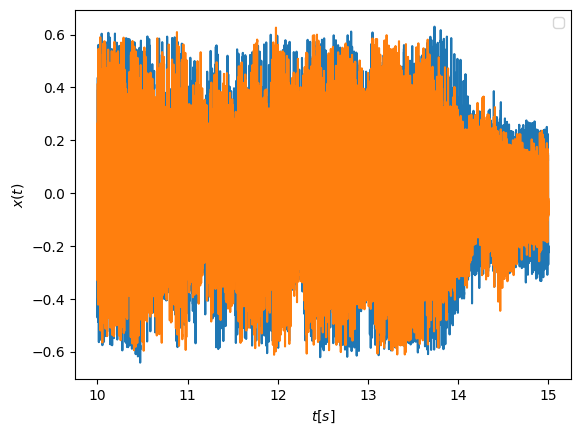

In [20]:
import numpy as np
import matplotlib.pyplot as plt

xpro = xb.copy() #copiar archivos para procesar
ti = 10 #tiempo incio a procesar seg
tf = 15 #tiempo final a procesar seg
xs = xpro[int(ti*fs2):int((tf*fs2)),:]

tt = np.arange(ti,tf,1/fs2) # vector de tiempo
plt.plot(tt,xs)
plt.legend(('canal 1','canal 2'))
plt.xlabel('$t[s]$')
plt.ylabel('$x(t)$')
plt.legend()
plt.show()

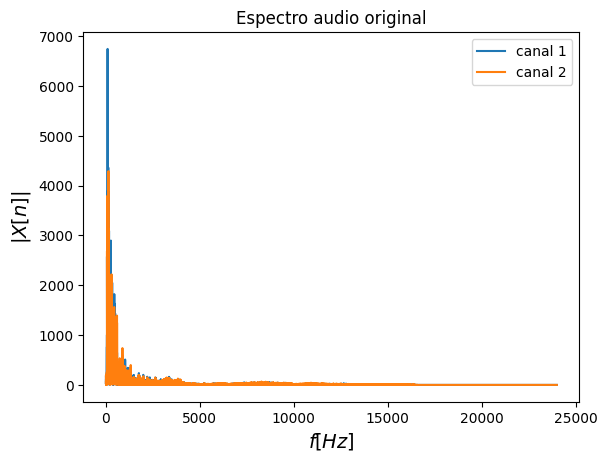

In [21]:
Xw = np.fft.rfft(xs,axis=0) # axis=0 permite aplicar fft por cada columna de xpro
#Xwc1 = np.fft.rfft(xs[:,0])
#Xwc2 = np.fft.rfft(xs[:,1])
vf = np.fft.rfftfreq(np.size(xs,0),1/fs2) #se crea el vector de frecuencias
plt.plot(vf,abs(Xw))#se grafica la magnitud
plt.legend(('canal 1','canal 2'))
plt.title(r'Espectro audio original')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

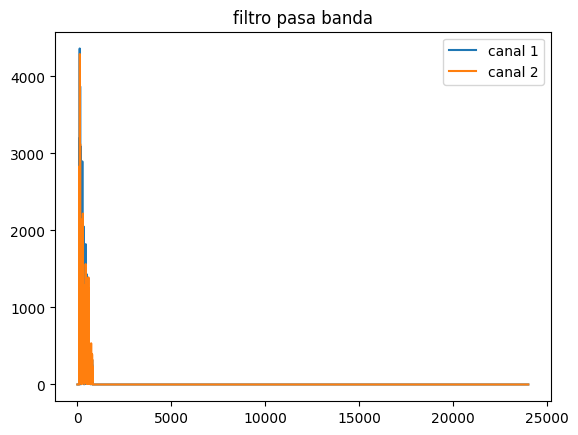

In [25]:
#Pasa banda, apagando los armónicos que no nos interesan
#filtrar espectro
Xwf = Xw.copy()
f1 = 100 #frecuencia en Hz corte 1
f2 = 800 #frecuencia en Hz corte 2
ind = ~((vf > f1) & (vf < f2)) #frecuencias eliminar-> recueder que ~ actua como negación
Xwf[ind,:] = 0
plt.plot(vf,abs(Xwf))
plt.title(f"filtro pasa banda")
plt.legend(('canal 1','canal 2'))
plt.show()

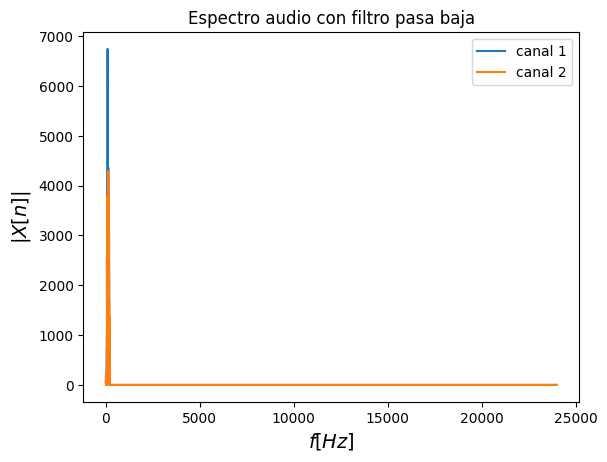

In [26]:
#Pasa baja
Xwf_lowpass = Xw.copy()
f_cutoff = 200 # Frecuencia de corte en Hz
ind_lowpass = vf > f_cutoff # Frecuencias a eliminar (mayores que la frecuencia de corte)
Xwf_lowpass[ind_lowpass,:] = 0
plt.plot(vf,abs(Xwf_lowpass))
plt.legend(('canal 1','canal 2'))
plt.title(f'Espectro audio con filtro pasa baja')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

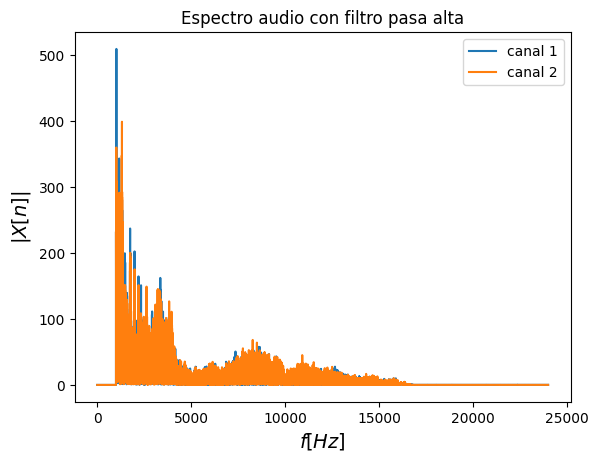

In [27]:
# filtro pasa alta
Xwf_highpass = Xw.copy()
f_cutoff_highpass = 1000 # Frecuencia de corte en Hz
ind_highpass = vf < f_cutoff_highpass # Frecuencias a eliminar (menores que la frecuencia de corte)
Xwf_highpass[ind_highpass,:] = 0
plt.plot(vf,abs(Xwf_highpass))
plt.legend(('canal 1','canal 2'))
plt.title(f'Espectro audio con filtro pasa alta')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

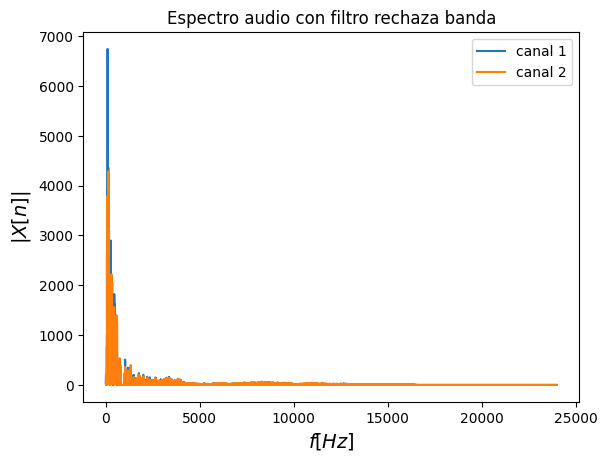

In [29]:
# Filtro rechaza banda
Xwf_rechaza_banda = Xw.copy()
f_low = 800  # Frecuencia de corte inferior en Hz
f_high = 1000 # Frecuencia de corte superior en Hz
ind_bandstop = (vf > f_low) & (vf < f_high) # Frecuencias a eliminar (entre las frecuencias de corte)
Xwf_rechaza_banda[ind_bandstop,:] = 0
plt.plot(vf,abs(Xwf_rechaza_banda))
plt.legend(('canal 1','canal 2'))
plt.title(f'Espectro audio con filtro rechaza banda')
plt.xlabel(r'$f[Hz]$',fontsize = 14)
plt.ylabel(r'$|X[n]|$',fontsize = 14)
plt.show()

# 1.2 Serie de Fourier

Semejanzas : Las tres representan la misma señal periódica, contienen los mismos armónicos.

Diferencias :


*   La trigonométrica representa senos y cosenos, la exponencial complejas, y la compacta coseno con fase.
*   La trigonométrica se usa más para señales reales, cuando hay simetría; la exponencial se usa para transformadas; Y la exponencial para visualización.


